In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import interact

import math
import scipy.optimize
from scipy.fftpack import fft
from scipy import signal

In [2]:
train = pd.read_csv('data/train_clean.csv', dtype={'time': np.float32, 'signal': np.float32, 'open_channels':np.int32})
test  = pd.read_csv('data/test_clean.csv',  dtype={'time': np.float32, 'signal': np.float32})

train_x = train["signal"].values
train_y = train["open_channels"].values

test_x = test["signal"].values
test_y = np.float32(np.load("data/test_preds.npy"))

train_x_segments = np.split(train_x, 10)
train_y_segments = np.split(train_y, 10)

test_x_segments = np.split(test_x, 20)
test_y_segments = np.split(test_y, 20)

### TRAIN: CORREGIR Y para igualarlo a X

Batch: 0 	W: 1.2364 	B: -2.72 	Diff std: 0.2483 	Diff mean: -0.000636
Batch: 1 	W: 1.2373 	B: -2.7309 	Diff std: 0.2499 	Diff mean: -5.6e-05
Batch: 2 	W: 1.235 	B: -2.7365 	Diff std: 0.2479 	Diff mean: -0.000395
Batch: 3 	W: 1.2313 	B: -2.7373 	Diff std: 0.2713 	Diff mean: -0.000388
Batch: 4 	W: 1.2337 	B: -5.4597 	Diff std: 0.4122 	Diff mean: -5.4e-05
Batch: 5 	W: 1.2344 	B: -2.734 	Diff std: 0.2918 	Diff mean: -0.000202
Batch: 6 	W: 1.2328 	B: -2.7336 	Diff std: 0.2478 	Diff mean: 0.000654
Batch: 7 	W: 1.2323 	B: -2.7359 	Diff std: 0.6621 	Diff mean: -0.003265
Batch: 8 	W: 1.237 	B: -2.7574 	Diff std: 0.2896 	Diff mean: 3e-05
Batch: 9 	W: 1.2331 	B: -5.4575 	Diff std: 0.4127 	Diff mean: -0.000201


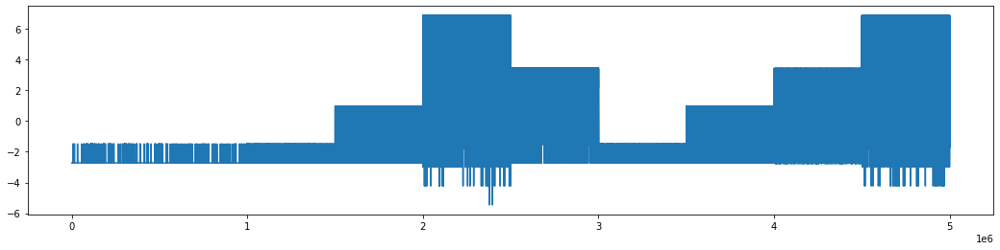

In [3]:
def correct_mae(params):
    w,b = params
    return np.mean(np.abs(x_segment - (y_segment*w + b)))

def correct_mse(params):
    w,b = params
    return np.mean(np.square(x_segment - (y_segment*w + b)))

train_y_corrected = np.array([])
for i,(x_segment, y_segment) in enumerate(zip(train_x_segments, train_y_segments)):
    res = scipy.optimize.minimize(correct_mae, (0.,0), method='Powell')
    w,b = res.x[0], res.x[1]
    y_corrected = y_segment*w + b
    train_y_corrected = np.append(train_y_corrected, y_corrected)
    print("Batch:",i,"\tW:",round(w,4),"\tB:",round(b,4),"\tDiff std:", round((x_segment - y_corrected).std(),  4),
                                                         "\tDiff mean:",round((x_segment - y_corrected).mean(), 6))
plt.figure(figsize=(18, 4)); plt.plot(train_y_corrected);

### Obetener NOISE con OPCION 1

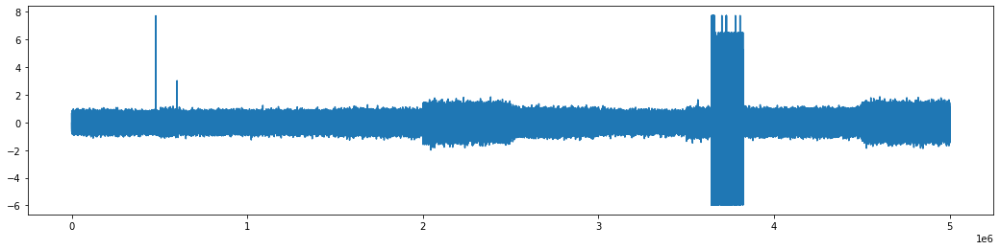

In [4]:
train_noise = train_x - train_y_corrected
plt.figure(figsize=(18, 4)); plt.plot(train_noise);

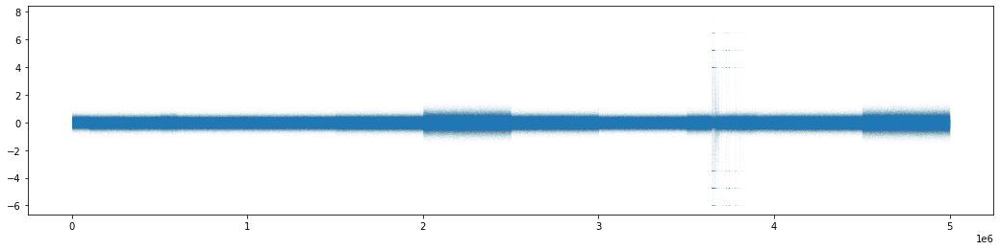

In [5]:
plt.figure(figsize=(18, 4)); plt.scatter(range(5000000),train_noise, s=0.1, alpha=0.01);

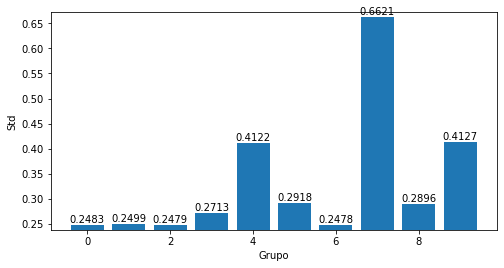

In [6]:
def plot_bar(array, xlabel, ylabel):
    plt.figure(figsize=(8, 4))
    plt.ylim([min(array)-0.01, max(array)+0.01])
    plot = plt.bar(list(range(len(array))), array)

    for value in plot:
        height = value.get_height()
        plt.text(value.get_x() + value.get_width()/2., 1.002*height,round(height,4), ha='center', va='bottom')

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()
    
train_noise_stds = [segment.std() for segment in np.split(train_noise, 10)]
plot_bar(train_noise_stds, "Grupo", "Std")

### TEST: CORREGIR Y para igualarlo a X

Batch: 0 	W: 1.2285 	B: -2.692 	Diff std: 0.2423 	Diff mean: -0.000977
Batch: 1 	W: 1.2345 	B: -2.7435 	Diff std: 0.2755 	Diff mean: -0.000527
Batch: 2 	W: 1.2406 	B: -2.7865 	Diff std: 0.2827 	Diff mean: 0.003885
Batch: 3 	W: 1.2201 	B: -2.6921 	Diff std: 0.2689 	Diff mean: 0.00043
Batch: 4 	W: 1.2318 	B: -2.7243 	Diff std: 0.2472 	Diff mean: -0.000805
Batch: 5 	W: 1.2424 	B: -5.5471 	Diff std: 0.3507 	Diff mean: 0.005763
Batch: 6 	W: 1.2366 	B: -2.7526 	Diff std: 0.2812 	Diff mean: 0.002241
Batch: 7 	W: 1.2411 	B: -5.5301 	Diff std: 0.3514 	Diff mean: 0.00429
Batch: 8 	W: 1.2229 	B: -2.706 	Diff std: 0.2631 	Diff mean: 0.003109
Batch: 9 	W: 1.2377 	B: -2.7452 	Diff std: 0.273 	Diff mean: -0.002014
Batch: 10 	W: 1.2318 	B: -2.7115 	Diff std: 0.2584 	Diff mean: 0.000693
Batch: 11 	W: 1.2224 	B: -2.694 	Diff std: 0.2565 	Diff mean: 0.001031
Batch: 12 	W: 1.2255 	B: -2.6961 	Diff std: 0.2573 	Diff mean: -0.001911
Batch: 13 	W: 1.2344 	B: -2.7312 	Diff std: 0.264 	Diff mean: 0.000152
Batc

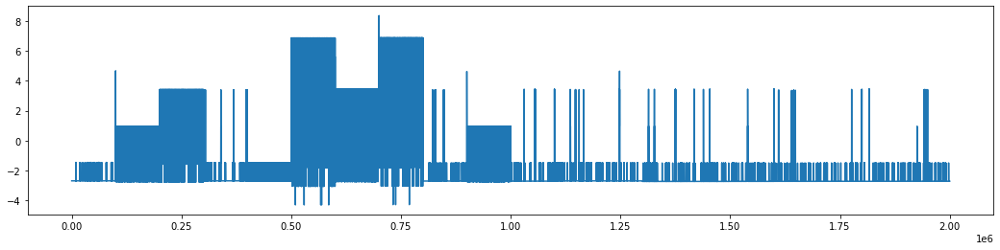

In [7]:
test_y_corrected = np.array([])
for i,(x_segment, y_segment) in enumerate(zip(test_x_segments, test_y_segments)):
    res = scipy.optimize.minimize(correct_mae, (0.,0), method='Powell')
    w,b = res.x[0], res.x[1]
    y_corrected = y_segment*w + b
    test_y_corrected = np.append(test_y_corrected, y_corrected)
    print("Batch:",i,"\tW:",round(w,4),"\tB:",round(b,4),"\tDiff std:", round((x_segment - y_corrected).std(),  4),
                                                         "\tDiff mean:",round((x_segment - y_corrected).mean(), 6))
plt.figure(figsize=(18, 4)); plt.plot(test_y_corrected);

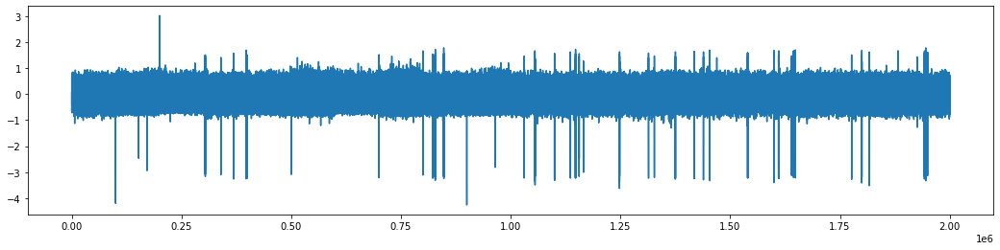

In [8]:
test_noise = test_x - test_y_corrected
plt.figure(figsize=(18, 4)); plt.plot(test_noise);

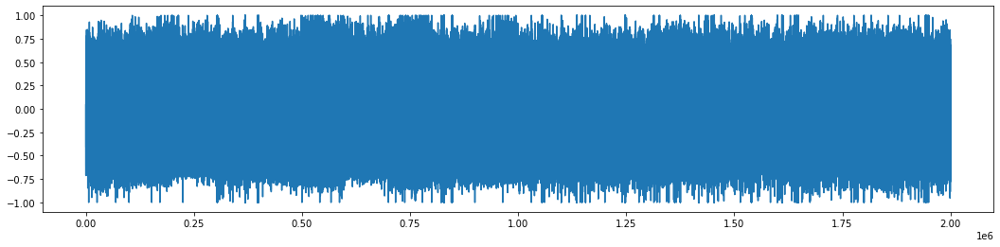

In [9]:
test_noise2 = test_noise.clip(-1,1)
plt.figure(figsize=(18, 4)); plt.plot(test_noise2);

# Spectogram TRAIN
- x: La señal
- fs: La frecuencia de muestreo (10000 muestras por seg)
- nfft: La resolucion de cuantas freqs

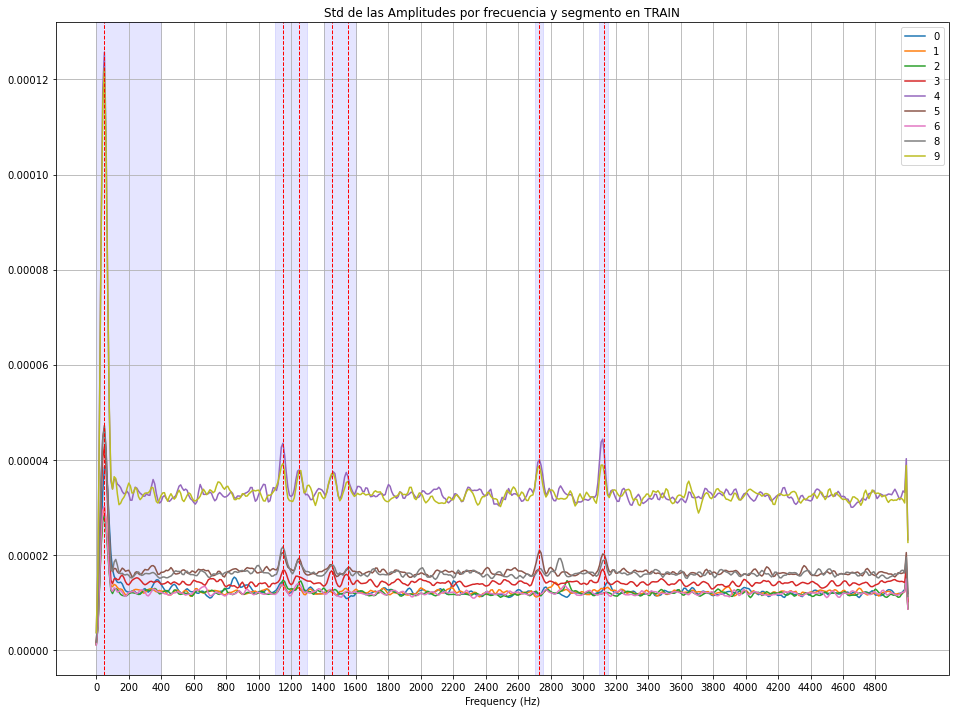

In [10]:
plt.figure(figsize=(16, 12))
plt.grid()
plt.xticks(np.arange(0, 5000, 200))
plt.xlabel("Frequency (Hz)")


for i,n in enumerate(np.split(train_noise, 10)):
    if i==7: continue
    f, t, spec = signal.spectrogram(x=n, fs=10000, nfft=1000)
    plt.plot(f, spec.std(axis=1));

plt.legend([0,1,2,3,4,5,6,8,9])
    
plt.axvspan(0,     400, alpha=0.1, color='blue')
plt.axvspan(1100, 1300, alpha=0.1, color='blue')
plt.axvspan(1400, 1600, alpha=0.1, color='blue')
plt.axvspan(2700, 2750, alpha=0.1, color='blue')
plt.axvspan(3100, 3150, alpha=0.1, color='blue')
plt.axvline(50,   color='r', linestyle='--', linewidth=1)
plt.axvline(1150, color='r', linestyle='--', linewidth=1)
plt.axvline(1250, color='r', linestyle='--', linewidth=1)
plt.axvline(1450, color='r', linestyle='--', linewidth=1)
plt.axvline(1550, color='r', linestyle='--', linewidth=1)
plt.axvline(2725, color='r', linestyle='--', linewidth=1)
plt.axvline(3125, color='r', linestyle='--', linewidth=1)
plt.title("Std de las Amplitudes por frecuencia y segmento en TRAIN");

Para pillar ... Hz, necesitaría una ventana de...
- **50** Hz -----> Ventana de **200**  (10000/50)
- **1150** Hz ---> Ventana de **8.69** (10000/1150)
- **1250** Hz ---> Ventana de **8**    (10000/1250)
- **1450** Hz ---> Ventana de **6.89** (10000/1450)
- **1550** Hz ---> Ventana de **6.45** (10000/1550)
- **2725** Hz ---> Ventana de **3.66** (10000/2725)
- **3125** Hz ---> Ventana de **3.2**  (10000/3125)

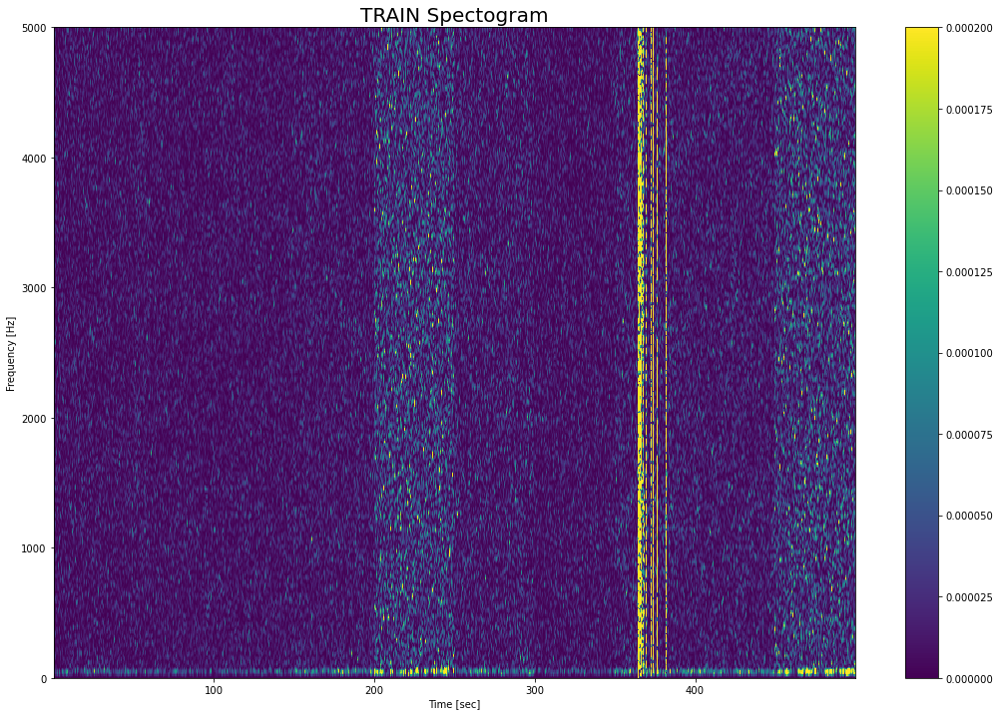

In [71]:
#signal = np.concatenate([train_noise[:]])
f, t, spec = signal.spectrogram(x=train_noise, fs=10000, nfft=1000)
plt.figure(figsize=(18, 12))
plt.pcolormesh(t, f, spec.clip(0,0.0002))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('TRAIN Spectogram', fontsize=20)
plt.colorbar()
plt.show()

In [ ]:
f, t, spec = signal.spectrogram(noise_y_corrected[:100000], fs=10000, mode="phase")
plt.figure(figsize=(18, 4))
plt.pcolormesh(t, f, spec)
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('Phase')
plt.show()

# Spectogram TEST

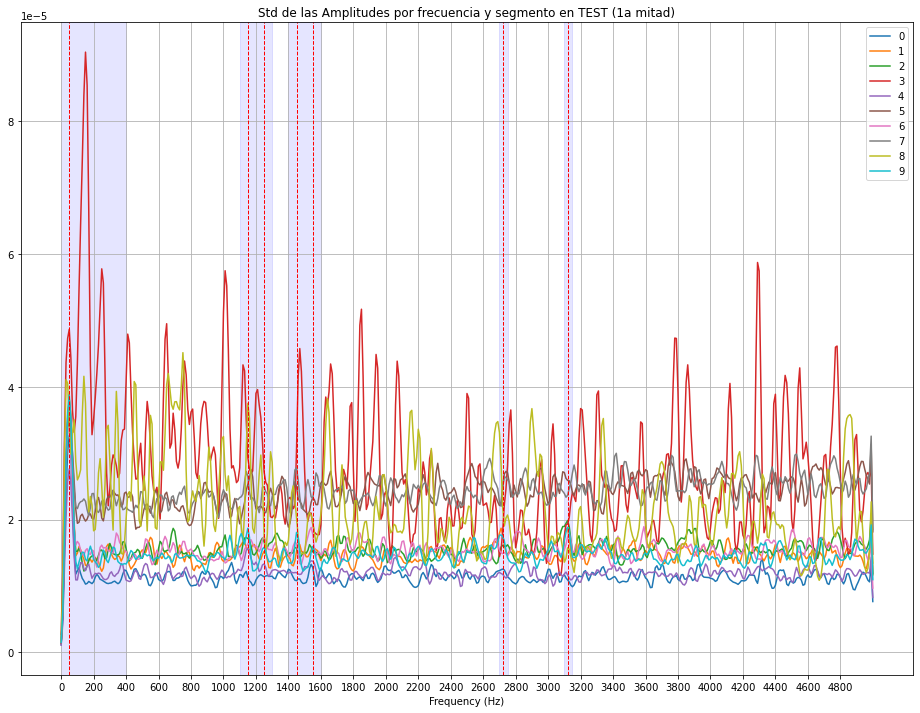

In [11]:
plt.figure(figsize=(16, 12))

plt.grid()
plt.xticks(np.arange(0, 5000, 200))
plt.xlabel("Frequency (Hz)")


for i,n in enumerate(np.split(test_noise, 20)):
    if i==10: break
    f, t, spec = signal.spectrogram(x=n, fs=10000, nfft=1000)
    plt.plot(f, spec.std(axis=1));
plt.legend([str(i) for i in range(10)])
plt.axvspan(0,     400, alpha=0.1, color='blue')
plt.axvspan(1100, 1300, alpha=0.1, color='blue')
plt.axvspan(1400, 1600, alpha=0.1, color='blue')
plt.axvspan(2700, 2750, alpha=0.1, color='blue')
plt.axvspan(3100, 3150, alpha=0.1, color='blue')
plt.axvline(50,   color='r', linestyle='--', linewidth=1)
plt.axvline(1150, color='r', linestyle='--', linewidth=1)
plt.axvline(1250, color='r', linestyle='--', linewidth=1)
plt.axvline(1450, color='r', linestyle='--', linewidth=1)
plt.axvline(1550, color='r', linestyle='--', linewidth=1)
plt.axvline(2725, color='r', linestyle='--', linewidth=1)
plt.axvline(3125, color='r', linestyle='--', linewidth=1)
plt.title("Std de las Amplitudes por frecuencia y segmento en TEST (1a mitad)");

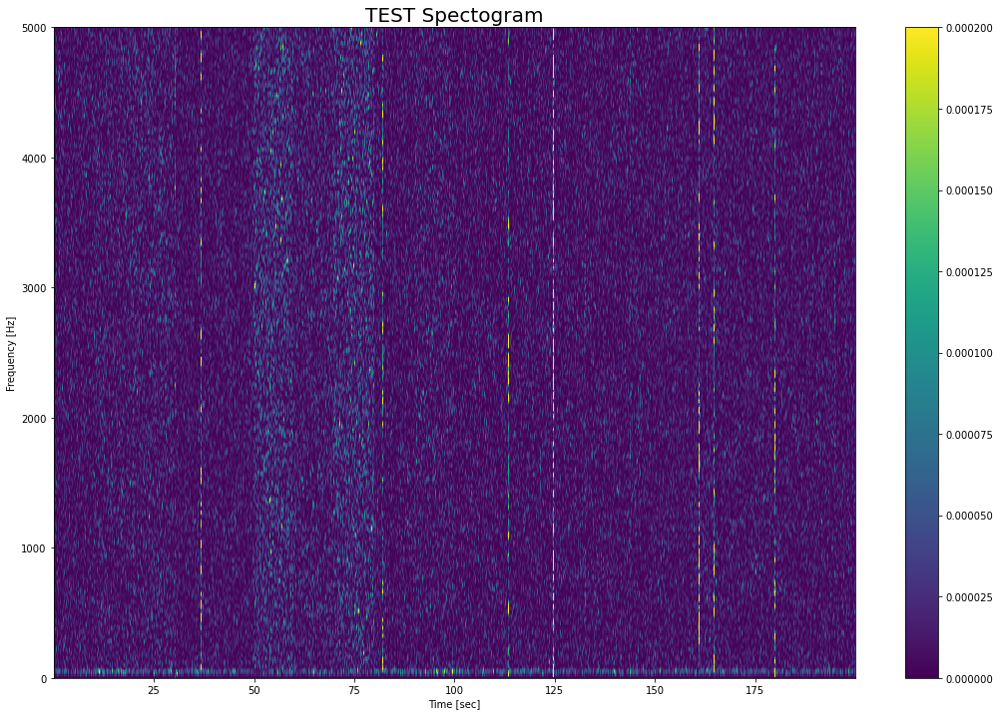

In [79]:
f, t, spec = signal.spectrogram(x=test_noise, fs=10000, nfft=1000)
plt.figure(figsize=(18, 12))
plt.pcolormesh(t, f, spec.clip(0,0.0002))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('TEST Spectogram', fontsize=20)
plt.colorbar()
plt.show()

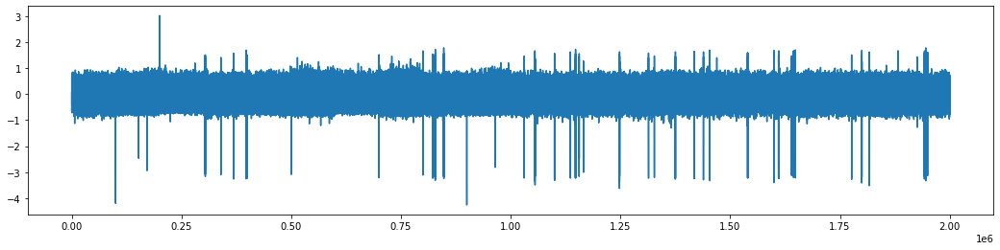

In [77]:
plt.figure(figsize=(18, 4)); plt.plot(test_noise);

# Fourier

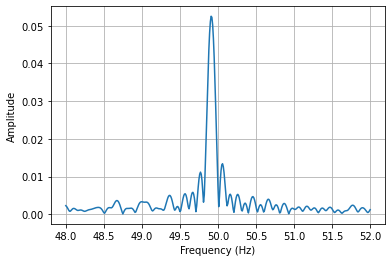

In [65]:
def fourier(signal, freq_muestreo, limit_freqs=None, res=1, plot=False):
    N = len(signal) * res
    T = 1.0 / freq_muestreo
    
    freqs = np.linspace(0.0, 1.0/(2.0*T), N//2) # xfft
    yfft  = fft(signal, n=N)[:N//2]
    ampls = 2.0/len(signal) * np.abs(yfft)
    fases = np.angle(yfft) + math.pi/2 # NO SE PQ el + math.pi/2 !!!!!!!!!!!!!
    #print(len(freqs), len(np.abs(ampls)),len(fases))
        
    if limit_freqs:
        lowFreq,topFreq = limit_freqs
        freqs = freqs[math.floor(lowFreq * T * N):math.ceil(topFreq * T * N)]
        ampls = ampls[math.floor(lowFreq * T * N):math.ceil(topFreq * T * N)]
        fases = fases[math.floor(lowFreq * T * N):math.ceil(topFreq * T * N)]
        
    if plot:
        plt.plot(freqs, ampls)
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.grid()
        plt.show()
        
    return freqs, ampls, fases

fourier(noise_y_corrected[:100000], freq_muestreo=10000, limit_freqs=(48,52),  res=10, plot=True);

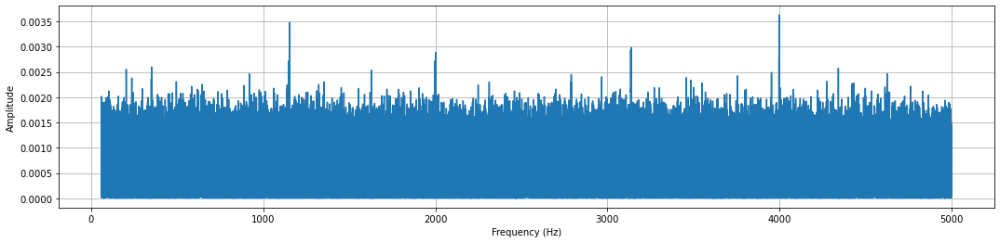

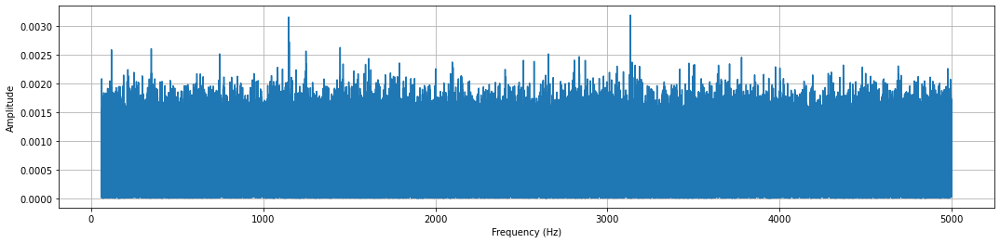

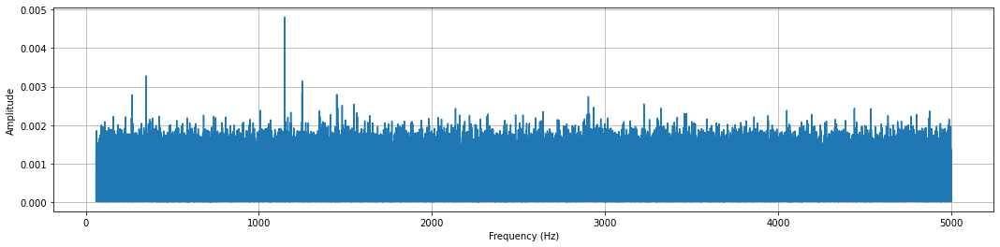

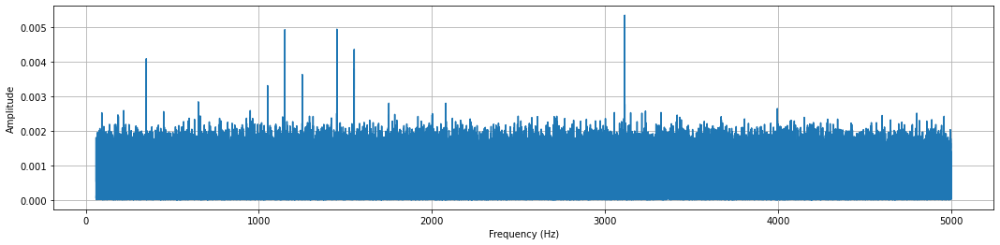

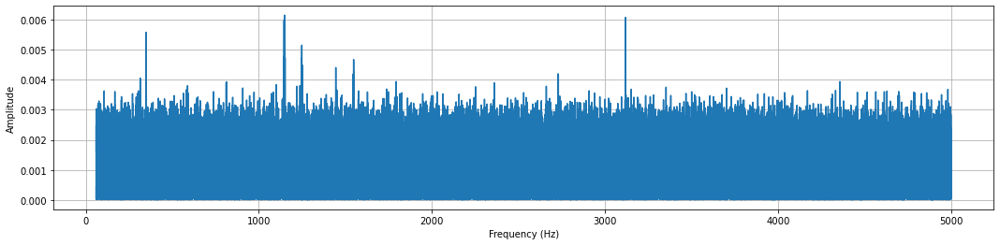

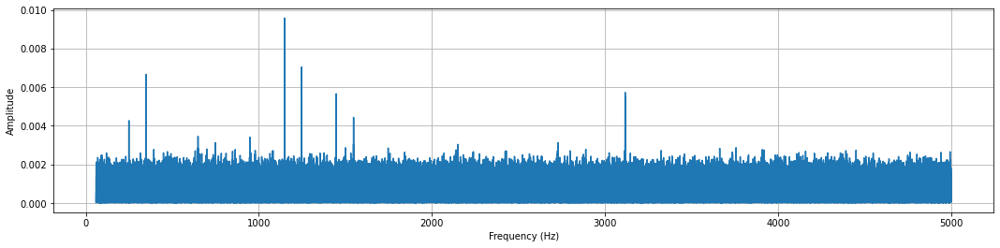

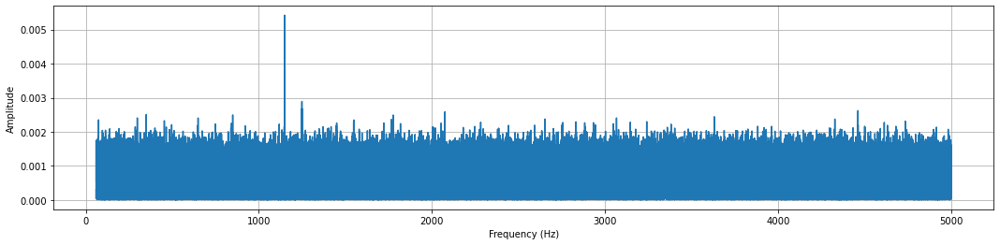

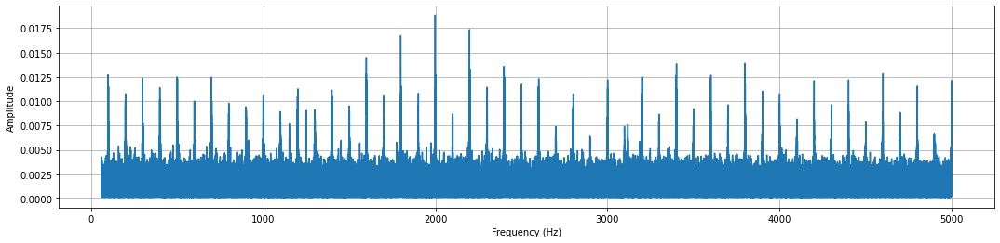

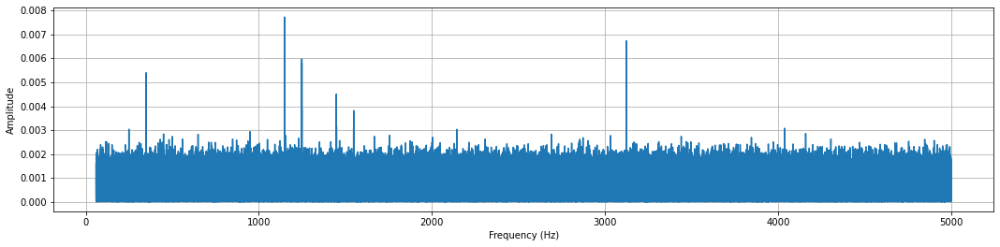

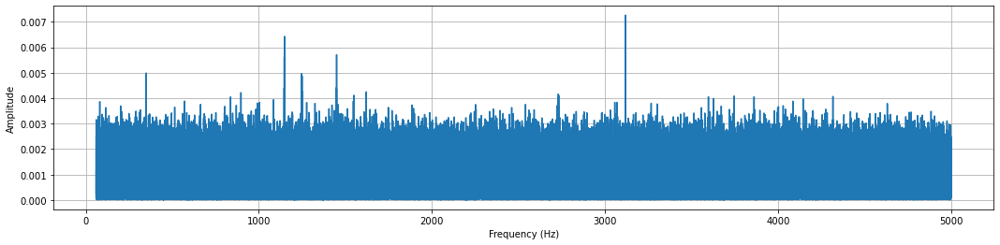

In [66]:
for i, noise_i in enumerate(np.split(noise_y_corrected, 10)):
    plt.figure(figsize=(18, 4))
    #plt.plot(x[i],y[i])
    fourier(noise_i, freq_muestreo=10000, limit_freqs=(60,5000),  res=10, plot=True);
    # Show/save figure as desired.
    plt.show()
# Can show all four figures at once by calling plt.show() here, outside the loop.
#plt.show()

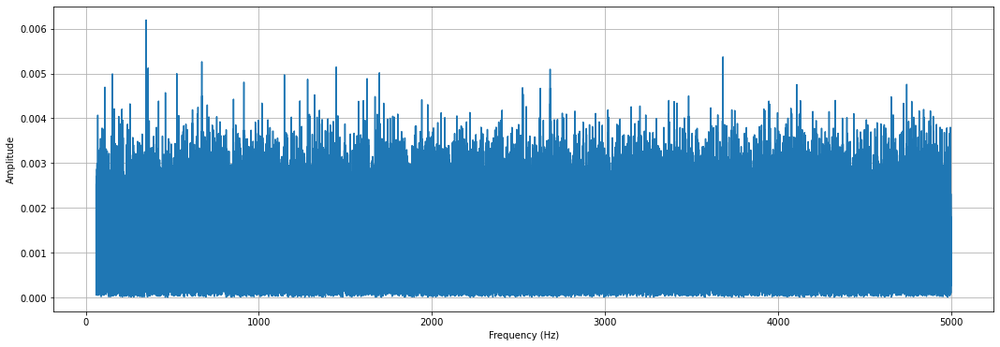

In [67]:
plt.figure(figsize=(18, 6))
fourier(noise_y_corrected[:100000], freq_muestreo=10000, limit_freqs=(60,5000),  res=10, plot=True);

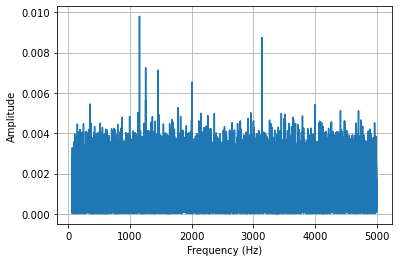

In [68]:
fourier(noise_y_corrected[100000:200000], freq_muestreo=10000, limit_freqs=(60,5000), res=10, plot=True);

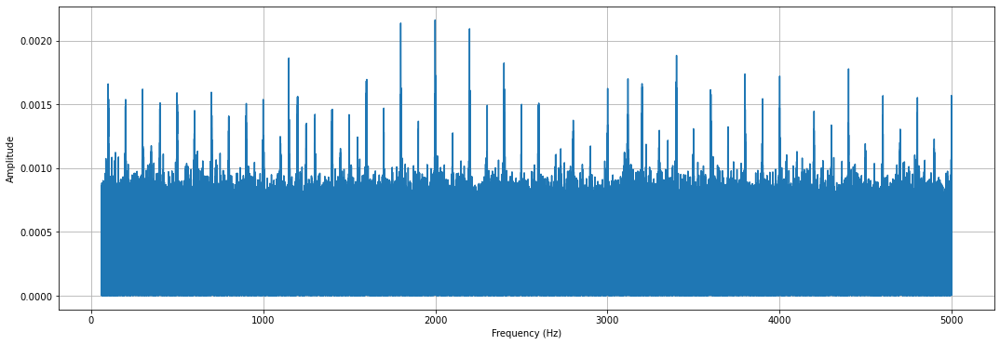

In [36]:
plt.figure(figsize=(18, 6))
fourier(noise_y_corrected, freq_muestreo=10000, limit_freqs=(60,5000), res=10, plot=True);

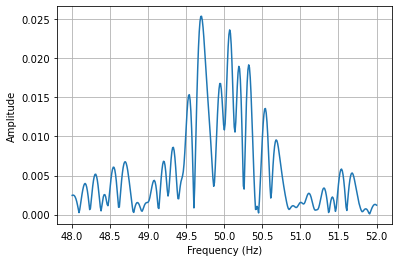

In [37]:
fourier(noise_y_corrected[3100000:3200000], freq_muestreo=10000, limit_freqs=(48,52), res=10, plot=True);

### Buscar las 50 onda equivalentes a noise AUTMATICAMENTE con la transformada de Fourier

Segment: 0 1 	freq: 49.913 	ampl: 0.0526 	phase: 4.4699
Segment: 0 2 	freq: 50.114 	ampl: 0.0557 	phase: 0.4288
Segment: 0 3 	freq: 50.14 	ampl: 0.0551 	phase: 3.1312
Segment: 0 4 	freq: 50.115 	ampl: 0.0569 	phase: 1.9956
Segment: 0 5 	freq: 49.946 	ampl: 0.0568 	phase: 2.8192
Segment: 1 1 	freq: 49.935 	ampl: 0.049 	phase: 4.229
Segment: 1 2 	freq: 49.924 	ampl: 0.0534 	phase: 0.7088
Segment: 1 3 	freq: 49.966 	ampl: 0.0535 	phase: 0.2674
Segment: 1 4 	freq: 50.037 	ampl: 0.0545 	phase: 1.2908
Segment: 1 5 	freq: 49.894 	ampl: 0.0547 	phase: 4.5754
Segment: 2 1 	freq: 50.0401 	ampl: 0.0557 	phase: -1.2357
Segment: 2 2 	freq: 50.0301 	ampl: 0.0521 	phase: 1.9151
Segment: 2 3 	freq: 50.0401 	ampl: 0.0489 	phase: 0.6616
Segment: 2 4 	freq: 50.0201 	ampl: 0.0509 	phase: 1.9769
Segment: 2 5 	freq: 50.0001 	ampl: 0.0502 	phase: 4.5935
Segment: 2 6 	freq: 49.9901 	ampl: 0.0531 	phase: 3.5954
Segment: 2 7 	freq: 49.9401 	ampl: 0.0527 	phase: 0.8456
Segment: 2 8 	freq: 50.0201 	ampl: 0.0526 	

Segment: 6 24 	freq: 50.0601 	ampl: 0.0534 	phase: -1.459
Segment: 6 25 	freq: 50.0601 	ampl: 0.055 	phase: 4.4051
Segment: 6 26 	freq: 49.9701 	ampl: 0.0569 	phase: 2.1802
Segment: 6 27 	freq: 49.9301 	ampl: 0.061 	phase: 4.3184
Segment: 6 28 	freq: 49.9901 	ampl: 0.0537 	phase: -0.0819
Segment: 6 29 	freq: 50.0401 	ampl: 0.0515 	phase: 2.785
Segment: 6 30 	freq: 49.9601 	ampl: 0.0555 	phase: 4.0661
Segment: 6 31 	freq: 50.0301 	ampl: 0.0523 	phase: 2.9887
Segment: 6 32 	freq: 50.0101 	ampl: 0.0558 	phase: 0.7484
Segment: 6 33 	freq: 50.0101 	ampl: 0.0538 	phase: 0.5536
Segment: 6 34 	freq: 49.9801 	ampl: 0.0539 	phase: 3.5388
Segment: 6 35 	freq: 49.9801 	ampl: 0.0547 	phase: -1.4096
Segment: 6 36 	freq: 49.9401 	ampl: 0.0541 	phase: 1.0082
Segment: 6 37 	freq: 49.9901 	ampl: 0.0545 	phase: 0.3559
Segment: 6 38 	freq: 49.9101 	ampl: 0.0539 	phase: 2.4187
Segment: 6 39 	freq: 50.0301 	ampl: 0.0537 	phase: 3.1004
Segment: 6 40 	freq: 50.0501 	ampl: 0.0555 	phase: 2.1696
Segment: 6 41 	

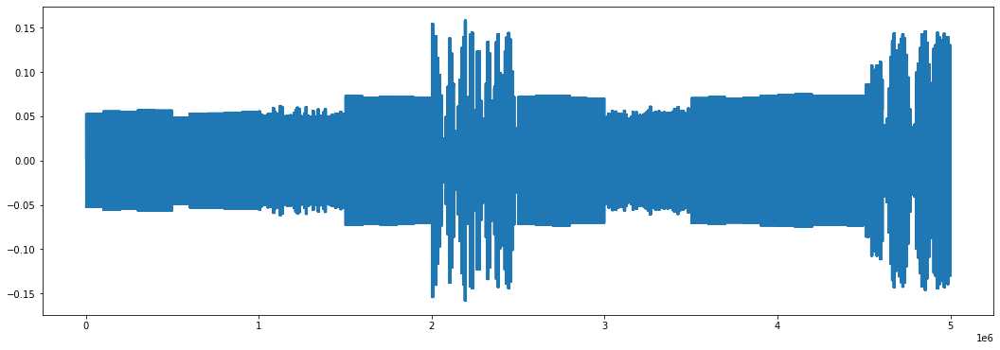

In [38]:
def wave(freq, ampl, phase, n_points):
    #return ampl * np.sin( np.arange(n_points)*freq + phase)
    return ampl * np.sin( np.arange(n_points)* 2 * math.pi / 10000 * freq + phase)


waves_50hz = np.array([])
for i, noise_i in enumerate(np.split(noise_y_corrected, 10)):
    if i in [2,4,6,9]: num_segments = 50
    else: num_segments = 5
    
    for j, noise_segment in enumerate(np.split(noise_i, num_segments)):
        
        freqs, ampls, fases = fourier(noise_segment, freq_muestreo=10000, limit_freqs=(48,52), res=100, plot=False);
    
        freq = freqs[ampls.argmax()]
        ampl = ampls[ampls.argmax()]
        fase = fases[ampls.argmax()]

        waves_50hz = np.append(waves_50hz, wave(freq, ampl, fase, len(noise_segment)))
        print("Segment:",i,j+1,"\tfreq:",round(freq,4),"\tampl:",round(ampl,4),"\tphase:",round(fase,4))

plt.figure(figsize=(18, 6)); plt.plot(waves_50hz);
        

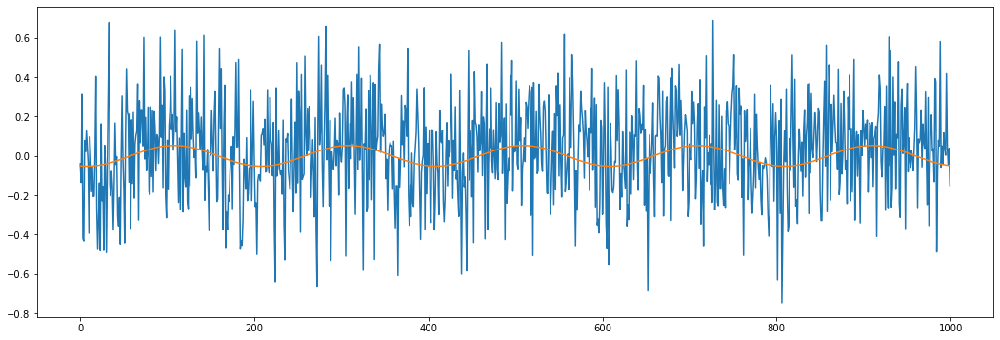

In [39]:
plt.figure(figsize=(18, 6))
plt.plot(noise_y_corrected[:1000]);
plt.plot(waves_50hz[:1000]);

### Comparar

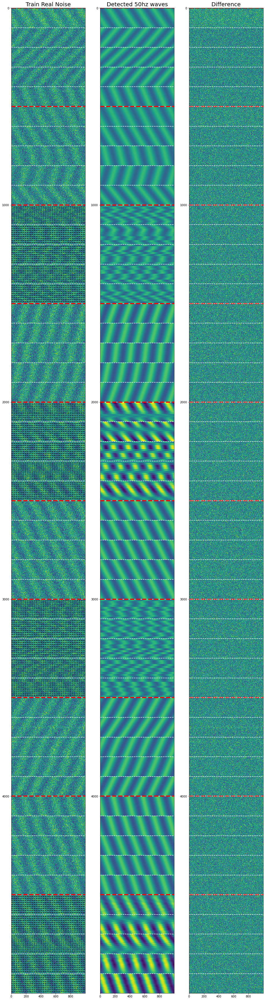

In [40]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 64))

ax[0].imshow(noise_y_corrected.reshape(-1, 1000).clip(-0.02,0.02), aspect='auto')
[ax[0].axhline(i, color='k', linestyle='--') for i in range(2000,2500,10)]
[ax[0].axhline(i, color='k', linestyle='--') for i in range(1000,1500,10)]
[ax[0].axhline(i, color='k', linestyle='--') for i in range(3000,3500,10)]
[ax[0].axhline(i, color='k', linestyle='--') for i in range(4500,5000,10)]
[ax[0].axhline(i, color='w', linestyle='--') for i in range(0,5000,100)]
[ax[0].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,5000,500)]
ax[0].set_title("Train Real Noise", fontsize=20);

ax[1].imshow(waves_50hz.reshape(-1, 1000), aspect='auto')
[ax[1].axhline(i, color='w', linestyle='--') for i in range(0,5000,100)]
[ax[1].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,5000,500)]
ax[1].set_title("Detected 50hz waves", fontsize=20);

diferencia = noise_y_corrected - waves_50hz
ax[2].imshow(diferencia.reshape(-1, 1000).clip(-0.02,0.02), aspect='auto')
[ax[2].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,5000,500)]
[ax[2].axhline(i, color='w', linestyle='--') for i in range(0,5000,100)]
ax[2].set_title("Difference", fontsize=20);

In [ ]:
x_without50hz = x - waves_50hz
np.save('data/train_x_without50hz.npy', x_without50hz)

In [ ]:
fourier(x, freq_muestreo=10000, limit_freqs=(48,52), res=10, plot=True);

In [ ]:
fourier(x_without50hz, freq_muestreo=10000, limit_freqs=(48,52), res=10, plot=True);

In [ ]:
x_without50hz[:5]

In [ ]:
x[:5]